In [46]:
import numpy as np
import gym
import random
import time
from IPython.display import clear_output
import matplotlib.pyplot as plt

In [17]:
env = gym.make("FrozenLake-v1")


In [18]:
action_space_size = env.action_space.n
print(f"action_space_size: {action_space_size}")
state_space_size = env.observation_space.n
print(f"state_space_size: {state_space_size}")

action_space_size: 4
state_space_size: 16


In [4]:
q_table = np.zeros((state_space_size,action_space_size))
q_table # state-action-values

array([[0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.],
       [0., 0., 0., 0.]])

In [56]:
num_episodes = 5000
max_steps_per_episode = 300

learning_rate = 0.1 # alpha
discount_factor = 0.99 # gamma

exploration_rate = 1
max_exploration_rate = 1
min_exploration_rate = 0.001
exploration_decay_rate = 0.1

In [29]:
q_table[1,1]

0.0

In [63]:
rewards_all_episodes = []
all_exploration_rates = []
for episode in range(num_episodes):
    state,state_prob = env.reset()
    # print(state)
    done = False
    reward_current_episode = 0
    
    for step in range(max_steps_per_episode):

        exploration_rate_threshold = random.uniform(0,1)
        if exploration_rate_threshold > exploration_rate:
            action = np.argmax(q_table[state,:])
        else:
            action = env.action_space.sample()
        
        new_state,reward,done,info,ext = env.step(action)
        print(f"New_state:{new_state},reward:{reward},Done:{done},Info:{info},Extra:{ext}")

        q_table[state,action] = q_table[state,action] * (1-learning_rate) + learning_rate*(reward+discount_factor*np.max(q_table[new_state,:]))
        state = new_state
        reward_current_episode+=reward
        print(reward_current_episode)
        # rewards_all_episodes.append(reward_current_episode)
        # print(sum(rewards_all_episodes))
        if done:
            break

        exploration_rate = min_exploration_rate+(max_exploration_rate-min_exploration_rate)*np.exp(-exploration_decay_rate*episode)

        all_exploration_rates.append(exploration_rate)


New_state:0,reward:0.0,Done:False,Info:False,Extra:{'prob': 0.3333333333333333}
0.0
New_state:0,reward:0.0,Done:False,Info:False,Extra:{'prob': 0.3333333333333333}
0.0
New_state:0,reward:0.0,Done:False,Info:False,Extra:{'prob': 0.3333333333333333}
0.0
New_state:0,reward:0.0,Done:False,Info:False,Extra:{'prob': 0.3333333333333333}
0.0
New_state:0,reward:0.0,Done:False,Info:False,Extra:{'prob': 0.3333333333333333}
0.0
New_state:0,reward:0.0,Done:False,Info:False,Extra:{'prob': 0.3333333333333333}
0.0
New_state:1,reward:0.0,Done:False,Info:False,Extra:{'prob': 0.3333333333333333}
0.0
New_state:2,reward:0.0,Done:False,Info:False,Extra:{'prob': 0.3333333333333333}
0.0
New_state:2,reward:0.0,Done:False,Info:False,Extra:{'prob': 0.3333333333333333}
0.0
New_state:3,reward:0.0,Done:False,Info:False,Extra:{'prob': 0.3333333333333333}
0.0
New_state:3,reward:0.0,Done:False,Info:False,Extra:{'prob': 0.3333333333333333}
0.0
New_state:2,reward:0.0,Done:False,Info:False,Extra:{'prob': 0.33333333333333

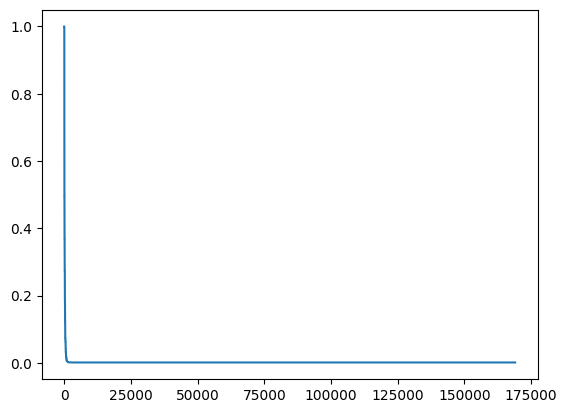

In [64]:
plt.plot(all_exploration_rates)
plt.show()

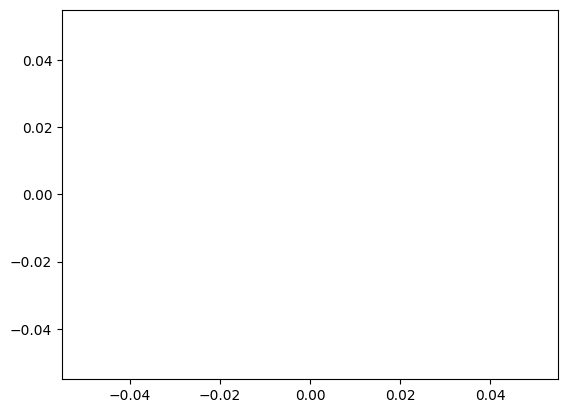

In [65]:
plt.plot(rewards_all_episodes[:500])

In [62]:
print(q_table)

[[9.27175006e-02 5.69940468e-02 8.40868528e-02 6.29255836e-02]
 [7.39337811e-02 4.19333391e-03 2.61588512e-03 6.22198552e-03]
 [8.70574606e-02 2.20817861e-03 5.45400794e-03 1.38242001e-03]
 [0.00000000e+00 9.77503464e-04 1.83868402e-04 1.85725658e-03]
 [9.68395420e-02 6.87545438e-02 5.10341568e-02 6.87547996e-02]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [1.45576068e-01 0.00000000e+00 2.12836168e-02 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [1.45317867e-02 3.10853503e-02 4.98107322e-02 1.06860222e-01]
 [2.13317184e-02 4.83469376e-02 6.11568202e-02 1.25150498e-01]
 [3.61489781e-01 4.99267434e-03 5.63850083e-02 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.00000000e+00]
 [6.59212253e-04 0.00000000e+00 9.50578186e-03 1.56461072e-01]
 [9.14493713e-02 1.09000000e-01 6.49674999e-01 0.00000000e+00]
 [0.00000000e+00 0.00000000e+00 0.00000000e+00 0.000000